# Chebyshev polynomial method for the Bogoliubov-de Gennes equations in the s-wave superconductor with a vortex lattice
We solve the Bogoliubov-de Gennes equations and s-wave gap equations, self-consistently. We use Julia 0.6.2.
## s-wave superconductor
### Uniform case
We consider s-wave superconductivity on the two-dimensional square lattice tight-binding model:
$$
H = \sum_{\langle i j\rangle} \sum_{\sigma = \uparrow,\downarrow} t c_{i \sigma}^{\dagger} c_{j \sigma} + \sum_i \sum_{\sigma = \uparrow,\downarrow} (- \mu)c_{i \sigma}^{\dagger}c_{i \sigma} + \sum_i \Delta_i c_{i \uparrow}^{\dagger} c_{i \downarrow}^{\dagger} + h.c.
$$  
We consider the indices $(i_x,i_y)$ with $i_x = 1,2,\cdots, N_x$ and $i_y = 1,2,\cdots,N_y$.


We solve the Bogoliubov-de Gennes equations:
$$
\left( 
\begin{matrix}
H_N & \Delta \\
\Delta^\dagger & - H_N^{\ast}
\end{matrix}
\right)
\left( 
\begin{matrix}
u_n \\
v_n
\end{matrix}
\right) = E_n \left( 
\begin{matrix}
u_n \\
v_n
\end{matrix}
\right)
$$


The references of the Chebyshev method are   
L. Covaci, F. M. Petters, and M. Berciu, Phys. Rev. Lett. **105**, 167006 (2010).  
Y. Nagai, Y. Ota and M. Machida, J. Phys. Soc. Jpn. **81**, 024710 (2012).  

In [1]:
include("./BdG.jl")
import .Bdgeq

nc = 1000 #Number of Chebyshev polynomials that we consider
Nx = 20 #System size
Ny = 20 #System size
aa = 10.0 #Chebyshev renormalize parameter
bb = 0.0
ωc = 10.0 #Cutoff energy
U = -2.0 #Interaction
initialΔ = 0.1 #Initial guess for the superconducting gap
μ = 1e-12 #Chemical potential


println("Chebyshev method")
full = false #Full diagonalization or not
vortex = false
mφ = 0
itemax = 20
@time mat_Δ = Bdgeq.iteration(nc,Nx,Ny,aa,bb,ωc,U,initialΔ,μ,full,vortex,itemax,mφ)
println("Full diagonalization")
full = true #Full diagonalization or not
vortex = false
itemax = 20
@time mat_Δ = Bdgeq.iteration(nc,Nx,Ny,aa,bb,ωc,U,initialΔ,μ,full,vortex,itemax,mφ)
println("Done.")


Chebyshev method
  2.999061 seconds (1.38 M allocations: 79.819 MiB, 0.65% gc time)
ite = 1 eps = 0.9184160830322747
center (Nx/2,Ny/2): 0.19583402751800943 + 0.0im
corner (1,1): 0.1958340275180094 + 0.0im
  2.467576 seconds (5.46 k allocations: 10.673 MiB, 0.18% gc time)
ite = 2 eps = 0.12251369904240222
center (Nx/2,Ny/2): 0.2643797695259539 + 0.0im
corner (1,1): 0.2643797695259538 + 0.0im
  2.345462 seconds (5.46 k allocations: 10.674 MiB)
ite = 3 eps = 0.031998112946923604
center (Nx/2,Ny/2): 0.3116720659641159 + 0.0im
corner (1,1): 0.3116720659641158 + 0.0im
  2.399066 seconds (5.46 k allocations: 10.674 MiB, 0.09% gc time)
ite = 4 eps = 0.007817696458271928
center (Nx/2,Ny/2): 0.33922940514942695 + 0.0im
corner (1,1): 0.3392294051494268 + 0.0im
  2.442180 seconds (5.46 k allocations: 10.674 MiB)
ite = 5 eps = 0.00312314955799112
center (Nx/2,Ny/2): 0.35818729002785543 + 0.0im
corner (1,1): 0.3581872900278551 + 0.0im
  2.398104 seconds (5.46 k allocations: 10.674 MiB, 0.07% gc tim

## Vortex lattice
The reference is M. Takigawa *et al.*, J. Phys. Soc. Jpn. **69**, 3943 (2000) [http://journals.jps.jp/doi/abs/10.1143/JPSJ.69.3943] or in arXiv [https://arxiv.org/abs/cond-mat/0004424].  
The paper:  
E. D. B. Smith, K. Tanaka and Y. Nagai, Phys. Rev. B **94**, 064515 (2016) [https://journals.aps.org/prb/abstract/10.1103/PhysRevB.94.064515] or in arXiv [https://arxiv.org/abs/1605.08934]  
is also useful. 

The vortex lattice is formed by uniform magnetic field applied in the +z direction, ${\bf H} = H {\hat z}$. 
The electron wave function acquires the Peierls phase factor while traversing from site j to i (coordinate from ${\bf r}_j$ to ${\bf r}_i$) due to the associated vector potential so that the hopping amplitude is modified as 
$$
t \exp \left[i \theta({\bf r}) \right],
$$
with the Peierls phase:
$$
\theta({\bf r}) = \frac{\pi}{\phi_0} \int_{{\bf r}_i}^{{\bf r}_j} d{\bf r} \cdot {\bf A}({\bf r}),
$$
where the vector potential 
$$
{\bf A}({\bf r}) = ({\bf H} \times {\bf r})/2,
$$
in the symmetric gauge. 
Here, $\phi_0 = hc/2e$ is a flux quanta. 
The field strength is controlled by the system size as 
$$
H = \frac{m_{\phi} \phi_0}{N_x N_y}.
$$
Here, $m_{\phi}$ is the number of vortices in the system area. 
In this note, we consider $m_{\phi} = 1$, two flux quanta in the system area. 


The vector potential in the square lattice tight-binding model is written as 
$$
{\bf A}({\bf r}) = (-Hy, Hx,0)/2,
$$
with ${\bf r} = (x,y)$.  
There are four hopping directions as follows.
1. $+x$ direction: $\theta({\bf r}) = -\pi y/(N_x N_y)$
2. $-x$ direction: $\theta({\bf r}) = \pi y/(N_x N_y)$
3. $+y$ direction: $\theta({\bf r}) = \pi x/(N_x N_y)$
4. $-y$ direction: $\theta({\bf r}) = -\pi x/(N_x N_y)$  


We impose the periodic boundary condition given by the symmetry for the translation
$$
{\bf R} = m {\bf u}_1 + n {\bf u}_2,
$$
with $m$ and $n$ are integers. ${\bf u}_1$ and ${\bf u}_2$ are unit vectors of the vortex lattice.
The periodic boundary condition for the wave function is 
$$
u_n ({\bf r} + {\bf R}) = u_n({\bf r}) e^{i \chi({\bf r},{\bf R})/2},
$$
$$
v_n ({\bf r} + {\bf R}) = v_n({\bf r}) e^{-i \chi({\bf r},{\bf R})/2}.
$$
Here, 
$$
\chi({\bf r},{\bf R}) = - \frac{2\pi}{\phi_0} {\bf A}({\bf R}) \cdot {\bf r} - \pi mn + \frac{2\pi}{\phi_0} ({\bf H} \times {\bf r}_0) \cdot {\bf R}
$$
in the symmetric gauge when the vortex center is located at 
$$
{\bf r}_{\rm center} = {\bf r}_0 + \frac{1}{2} (u_1 + u_2).
$$
With the use of the relation $({\bf H} \times {\bf r}_0) \cdot {\bf R} = ({\bf R}\times {\bf H}) \cdot {\bf r}_0 =  -({\bf H}\times 2{\bf R}) \cdot {\bf r}_0$, we obtain
$$
\chi({\bf r},{\bf R}) = - \frac{2\pi}{\phi_0} {\bf A}({\bf R}) \cdot ({\bf r}+2{\bf r}_0) - \pi mn 
$$

In this note, we consider that there is a quarter vortex at each of the four corners centered right outside the corner site. 
So, we consider ${\bf r}_0 = 0$ and 
$$
u_1 = (N_x,0),
$$
$$
u_2 = (0,N_y).
$$  

We consider four sides as follows.
1. $i_x = N_x$: There is a hopping from $j_x = 1$ to $N_x$. In this case, $m = 1$ and $n = 0$ because of ${\bf R} = u_1$.
2. $i_y = N_y$: There is a hopping from $j_y = 1$ to $N_y$. In this case, $m = 0$ and $n = 1$ because of ${\bf R} = u_2$.
3. $i_x = 1$: There is a hopping from $j_x = N_x$ to $1$. In this case, $m = -1$ and $n = 0$ because of ${\bf R} = -u_1$.
4. $i_y = 1$: There is a hopping from $j_y = N_y$ to $1$. In this case, $m = 0$ and $n = -1$ because of ${\bf R} = -u_2$.


We consider the vortex lattice system, which has same parameters in Fig. 1. in J. Phys. Soc. Jpn. 81, 024710 (2012),  except for the lattice size.


In [2]:
#using Plots
include("./BdG.jl")
import .Bdgeq

nc = 1000 #Number of Chebyshev polynomials that we consider
Nx = 24 #System size
Ny = 24 #System size
aa = 10.0 #Chebyshev renormalize parameter
bb = 0.0
ωc = 10.0 #Cutoff energy
U = -2.2 #Interaction
initialΔ = 0.1 #Initial guess for the superconducting gap
μ = -1.5 #Chemical potential
mφ = 1
println("Chebyshev method")
full = false #Full diagonalization or not
vortex = true
itemax = 20
@time mat_Δ = Bdgeq.iteration(nc,Nx,Ny,aa,bb,ωc,U,initialΔ,μ,full,vortex,itemax,mφ)
println("Full diagonalization")
full = true #Full diagonalization or not
vortex = true
itemax = 20
@time mat_Δ = Bdgeq.iteration(nc,Nx,Ny,aa,bb,ωc,U,initialΔ,μ,full,vortex,itemax,mφ)
println("Done.")





Chebyshev method


  8.603968 seconds (586.14 k allocations: 68.693 MiB, 0.15% gc time)
ite = 1 eps = 0.046884077608464254
center (Nx/2,Ny/2): 0.12135614667359075 - 2.4690286166530273e-19im
corner (1,1): 0.07024579908681504 + 3.55431697763452e-19im
  8.701893 seconds (9.79 k allocations: 39.569 MiB, 0.02% gc time)
ite = 2 eps = 0.025939223962988492
center (Nx/2,Ny/2): 0.1409028570082776 + 5.951701237375778e-20im
corner (1,1): 0.058401749602458114 - 8.271241116186807e-19im
  8.618622 seconds (9.79 k allocations: 39.569 MiB, 0.03% gc time)
ite = 3 eps = 0.014881766457562505
center (Nx/2,Ny/2): 0.15818687103008183 - 5.557097224153568e-19im
corner (1,1): 0.05375989277022402 - 6.074057319166368e-18im
  8.303203 seconds (9.79 k allocations: 39.569 MiB, 0.02% gc time)
ite = 4 eps = 0.008505597140833232
center (Nx/2,Ny/2): 0.1732336041735008 + 2.773022816003307e-19im
corner (1,1): 0.05158085954384128 - 8.899345271772784e-18im
  8.296364 seconds (9.79 k allocations: 39.568 MiB, 0.02% gc time)
ite = 5 eps = 0.0046

  2.250083 seconds (4.58 M allocations: 182.322 MiB, 3.01% gc time)
ite = 18 eps = 1.4175531620460944e-6
center (Nx/2,Ny/2): 0.22190822779140706 + 5.932898356775892e-17im
corner (1,1): 0.05682557059579451 - 1.2106553040442367e-16im
  2.244435 seconds (4.58 M allocations: 182.322 MiB, 3.01% gc time)
ite = 19 eps = 7.616968612174968e-7
End 0.22051881910636228 + 0.006900237474782611im
 43.565545 seconds (87.17 M allocations: 3.393 GiB, 3.19% gc time)
Done.


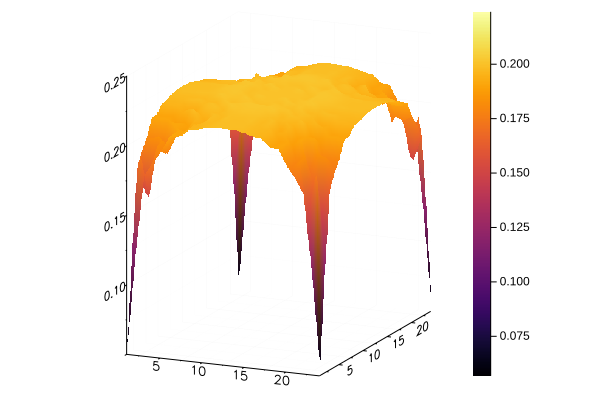

In [3]:
linspace(start,stop,length) = range(start, stop=stop, length=length)
x = linspace(1,Nx,Nx)
y = linspace(1,Ny,Ny)
using Plots
plot(x,y,abs.(mat_Δ),st=:surface)

Two vortices in the unit cell

In [4]:
#using Plots
include("./BdG.jl")
import .Bdgeq

nc = 1000 #Number of Chebyshev polynomials that we consider
Nx = 24 #System size
Ny = 24 #System size
aa = 10.0 #Chebyshev renormalize parameter
bb = 0.0
ωc = 10.0 #Cutoff energy
U = -2.2 #Interaction
initialΔ = 0.1 #Initial guess for the superconducting gap
μ = -1.5 #Chemical potential
mφ = 2
println("Chebyshev method")
full = false #Full diagonalization or not
vortex = true
itemax = 20
@time mat_Δ = Bdgeq.iteration(nc,Nx,Ny,aa,bb,ωc,U,initialΔ,μ,full,vortex,itemax,mφ)
println("Full diagonalization")
full = true #Full diagonalization or not
vortex = true
itemax = 20
@time mat_Δ = Bdgeq.iteration(nc,Nx,Ny,aa,bb,ωc,U,initialΔ,μ,full,vortex,itemax,mφ)
println("Done.")




Chebyshev method


  9.237536 seconds (971.60 k allocations: 87.926 MiB, 0.30% gc time)
ite = 1 eps = 2.1741602194085954
center (Nx/2,Ny/2): -0.0465909601900119 + 0.0465909601900119im
corner (1,1): -0.04975815421232696 + 0.049758154212326974im
  8.540899 seconds (9.79 k allocations: 39.568 MiB, 0.07% gc time)
ite = 2 eps = 0.008866247806842486
center (Nx/2,Ny/2): -0.034803811712120346 + 0.034803811712120346im
corner (1,1): -0.04009079305599943 + 0.04009079305599942im
  8.390249 seconds (9.79 k allocations: 39.569 MiB, 0.05% gc time)
ite = 3 eps = 0.005926305021966488
center (Nx/2,Ny/2): -0.029279974857258768 + 0.029279974857258778im
corner (1,1): -0.03585112057852585 + 0.03585112057852586im
  8.395616 seconds (9.79 k allocations: 39.569 MiB, 0.04% gc time)
ite = 4 eps = 0.004160303238559531
center (Nx/2,Ny/2): -0.027040066807659396 + 0.027040066807659406im
corner (1,1): -0.03424429465910503 + 0.034244294659105036im
  8.647856 seconds (9.80 k allocations: 39.569 MiB, 0.02% gc time)
ite = 5 eps = 0.0029899

  2.422313 seconds (4.58 M allocations: 182.322 MiB, 4.39% gc time)
ite = 17 eps = 6.729902358869364e-5
center (Nx/2,Ny/2): -0.05264378931736316 + 0.052643789317363285im
corner (1,1): -0.056361411017232965 + 0.05636141101723279im
  2.368028 seconds (4.58 M allocations: 182.322 MiB, 0.94% gc time)
ite = 18 eps = 4.753527834522257e-5
center (Nx/2,Ny/2): -0.05322539133909481 + 0.05322539133909488im
corner (1,1): -0.05666318113977255 + 0.05666318113977241im
  2.428718 seconds (4.58 M allocations: 182.322 MiB, 4.34% gc time)
ite = 19 eps = 3.371929760911488e-5
center (Nx/2,Ny/2): -0.053661531523728455 + 0.05366153152372815im
corner (1,1): -0.056862863803116954 + 0.05686286380311692im
  2.320839 seconds (4.58 M allocations: 182.322 MiB, 4.50% gc time)
ite = 20 eps = 2.405708468787425e-5
center (Nx/2,Ny/2): -0.05397339525933842 + 0.05397339525933811im
corner (1,1): -0.056977169880693415 + 0.0569771698806931im
 47.551307 seconds (91.72 M allocations: 3.570 GiB, 3.40% gc time)
Done.


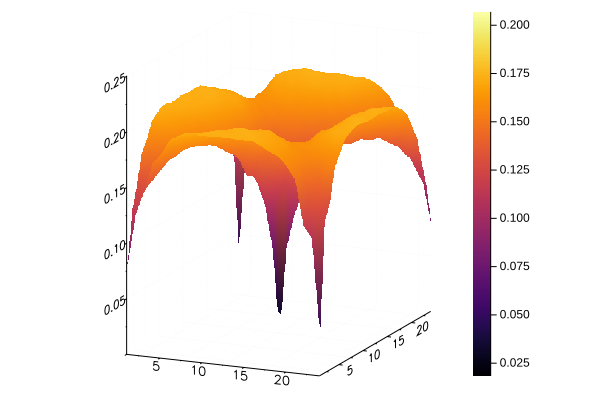

In [5]:
linspace(start,stop,length) = range(start, stop=stop, length=length)
x = linspace(1,Nx,Nx)
y = linspace(1,Ny,Ny)
using Plots
plot(x,y,abs.(mat_Δ),st=:surface)

In [6]:
using .Bdgeq

In [7]:
?Bdgeq.calc_A_vortex

```
calc_A_vortex(Nx,Ny,μ,Δ,aa,mφ)

Calculate the Hamiltonian in 2D square lattice
Nx: Number of sites in x-direction
Ny: Number of sites in y-direction
μ: Chemical Potential
Δ: Given order parameters
aa: Renormalize factor, which is used in Chebyshev polynomial method
mφ: Number of vortices in the unit cell
```
